# Чтение QR‑кодов. Использование OpenCV и Tesseract для распознавания текста на изображении, применение PyMuPDF для распознавания текста в pdf-сканах


## Чтение QR‑кодов

QR-код — тип матричного штрих-кода, который представляет собой машиночитаемую оптическую этикетку, которая содержит информацию об элементе, к которому она прикреплена. На практике QR-коды часто содержат данные для локатора, идентификатора или трекера, который указывает на веб-сайт или приложение и т.д.

Разберемся, как считывать и декодировать штрих-коды, а также находить их на изображении, а затем - как сгенерировать и прочитать QR-коды в Python с помощью библиотек [**qrcode**](https://pypi.org/project/qrcode/) и **OpenCV**.

Предварительно необходимо установить нужные нам зависимости:

In [ ]:
!pip install qrcode

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.2/46.2 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 kB 6.1 MB/s eta 0:00:00


Импортируем необходимые библиотеки:

In [6]:
import cv2 # импорт Open CV
from google.colab.patches import cv2_imshow # cv2_imshow служит для отображения картинок в Google Colab
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

#import qrcode

%matplotlib inline

In [ ]:
import qrcode

data = "https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab_channel=RickAstley"

filename = "RickAstley" # имя выходного файла

img = qrcode.make(data) # генерируем qr-код

img.save(filename) # сохраняем img в файл

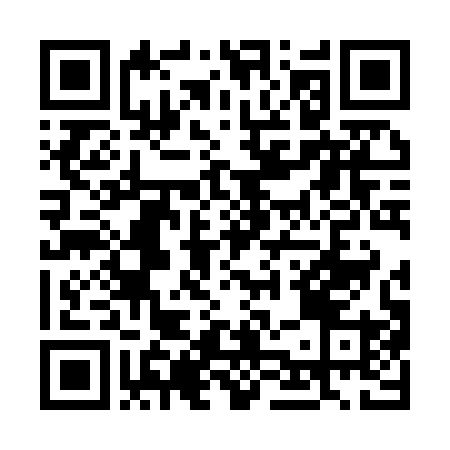

In [ ]:
img

In [ ]:
import qrcode
import numpy as np

data = "https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab_channel=RickAstley"# данные для кодирования

qr = qrcode.QRCode(version=1, box_size=10, border=4)# создать экземпляр объекта QRCode

qr.add_data(data)# добавить данные в QR-код

qr.make()# компилируем данные в массив QR-кода

print("The shape of the QR image:", np.array(qr.get_matrix()).shape)# распечатать форму изображения

img = qr.make_image(fill_color="red", back_color="green")# переносим массив в реальное изображение

img.save("portal.edu.asu.ru.png")# сохраняем в файл

The shape of the QR image: (45, 45)


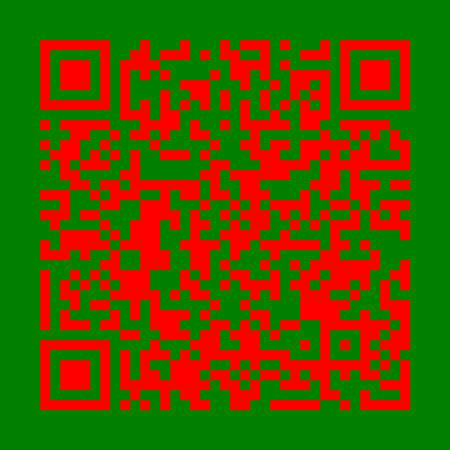

In [ ]:
img

При создании класса **QRCode** мы указываем параметр версии, который представляет собой целое число от 1 до 40, которое контролирует размер изображения QR-кода (1 — маленький, матрица 21×21, 40 — матрица 185×185), но это будет перезаписано, когда данные не соответствуют указанному вами размеру. В нашем случае он автоматически масштабируется до версии 3.

Параметр box_size управляет количеством пикселей в каждом прямоугольнике QR-кода, тогда как граница определяет, сколько прямоугольников должно иметь толщину.

Затем мы добавляем данные с помощью метода **qr.add_data()**, компилируем их в массив с помощью метода **qr.make()**, а затем создаем фактическое изображение с помощью метода **qr.make_image()**. Мы указали белый цвет как **fill_color** и черный как **back_color**, что является полной противоположностью QR-коду по умолчанию

Есть много инструментов, считывающих QR-код. Однако для этого мы будем использовать библиотеку **OpenCV**.

In [ ]:
img = cv2.imread("qr.jpg")

 OpenCV имеет встроенный детектор QR-кода:

In [ ]:
detector = cv2.QRCodeDetector() # инициализируем детектор QRCode

У нас есть изображение и детектор, давайте обнаружим и расшифруем эти данные:

In [ ]:
data, bbox, straight_qrcode = detector.detectAndDecode(img) # обнаружить и декодировать

Функция **detectAndDecode()** принимает изображение в качестве входных данных и декодирует его, чтобы вернуть кортеж из 3 значений: данные, декодированные из QR-кода, выходной массив вершин найденного четырехугольника QR-кода и выходное изображение, содержащее исправленный и преобразованный в двоичную форму QR-код.

Здесь нам просто нужны данные:

In [ ]:
if bbox is not None:
    print(f"QRCode data:\n{data}")


QRCode data:
http://www.bio.asu.ru/


## Использование OpenCV и Tesseract для распознавания текста на изображении

Мы легко понимаем текст на картинке, просто на неё взглянув. Однако, с компьютерам всё как‑то не так. Им нужна какая‑то мето́да или алгоритм. Здесь на помощь приходит **Optical Character Recognition (OCR)** или оптическое распознавание символов. Оптическое распознавание символов — это процесс обнаружения текстового содержимого на изображениях и преобразование его в машинно-кодированный текст, к которому мы можем получить доступ и манипулировать в Python (или любом другом языке программирования) как со строковой переменной, для этого будем использовать библиотеку **Tesseract** (Есть несколько альтернативных решений, например, **PyOCR**, но **Tesseract** - наиболее распространен).

Мы собираемся использовать модуль **pytesseract** для Python, который является оболочкой для движка **Tesseract‑OCR**. Установим его:

In [ ]:
!ls

de_text1.png  portal.edu.asu.ru.png  qr_code.png  qr.jpg  RickAstley  sample_data


In [9]:
#!pip install pillow
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [ ]:
!apt install tesseract-ocr-deu

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following NEW packages will be installed:
  tesseract-ocr-deu
0 upgraded, 1 newly installed, 0 to remove and 45 not upgraded.
Need to get 744 kB of archives.
After this operation, 1,540 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-deu all 1:4.00~git30-7274cfa-1.1 [744 kB]
Fetched 744 kB in 1s (612 kB/s)
Selecting previously unselected package tesseract-ocr-deu.
(Reading database ... 121804 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-deu_1%3a4.00~git30-7274cfa-1.1_all.deb ...
Unpacking tesseract-ocr-deu (1:4.00~git30-7274cfa-1.1) ...
Setting up tesseract-ocr-deu (1:4.00~git30-7274cfa-1.1) ...


In [ ]:
import pytesseract

In [ ]:
def open_image(fileName):
  image = cv2.imread(fileName) # считываем данные графического файла в переменную image
  cv2_imshow(image)
  return image

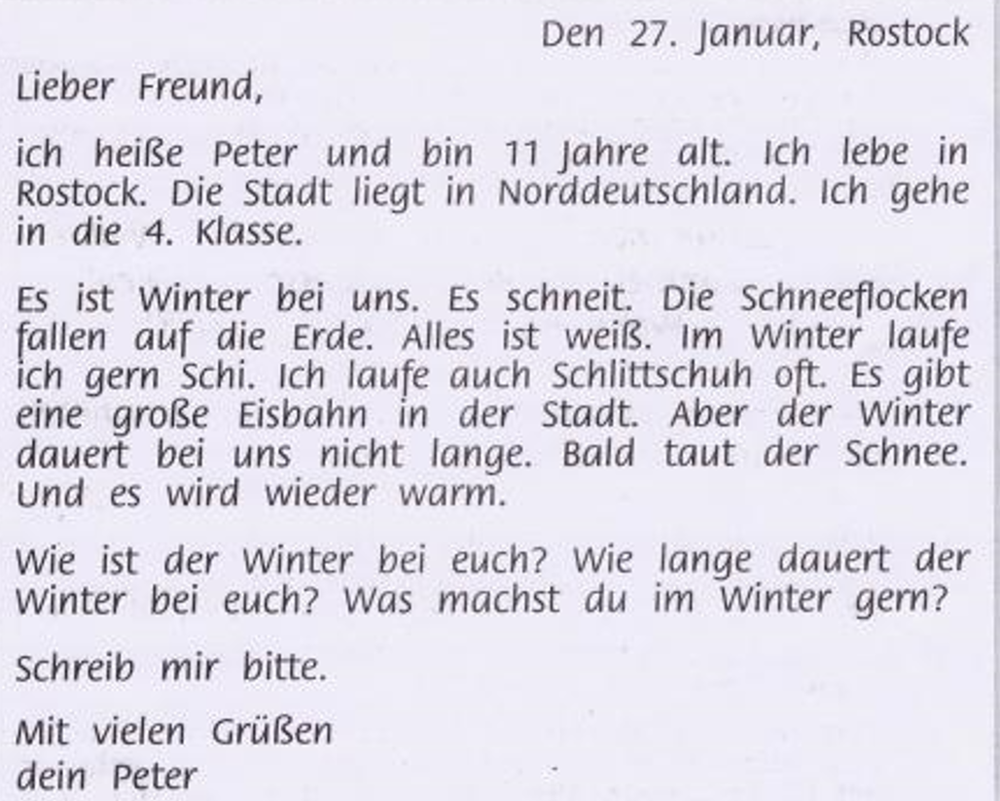

In [ ]:
image = open_image('de_text1.png')

Загрузить изображение можно с помощью OpenCV или Pillow, немного предпочтительно использовать OpenCV, поскольку он позволяет нам использовать камеру.

Давайте распознаем этот текст:



In [ ]:
#string = pytesseract.image_to_string(image) # получаем строку
string = pytesseract.image_to_string(image, lang='deu')

print(string)# печатаем

Den 27. Januar, Rostock
Lieber Freund,

ich heiße Peter und bin 11 jahre alt. Ich lebe in
Rostock. Die Stadt liegt in Norddeutschland. Ich gehe
in die 4. Klasse.

Es ist Winter bei uns. Es schneit. Die Schneeflocken
fallen auf die Erde. Alles ist weiß. Im Winter laufe
ich gern Schi. Ich laufe auch Schlittschuh oft. Es gibt
eine große Eisbahn in der Stadt. Aber der Winter
dauert bei uns nicht lange. Bald taut der Schnee.
Und es wird wieder warm.

wie ist der Winter bei euch? Wie lange dauert der
Winter bei euch? Was machst du im Winter gern?

Schreib mir bitte.

Mit vielen Grüßen
dein Peter



Есть еще одна функция **image_to_data()**, которая выводит больше информации, включая слова с соответствующими им шириной, высотой и координатами **x**, **y**, что позволит нам сделать много полезного. Например, найдем слова в документе и нарисуем ограничивающую рамку вокруг определенного слова:



In [ ]:
image_copy = image.copy() # чтобы нарисовать сделаем копию изображения

target_word = "ich" # слово для поиска

data = pytesseract.image_to_data(image, output_type=pytesseract.Output.DICT) # получить все данные из изображения

Итак, мы собираемся искать слово **«dog»** в текстовом документе и хотим, чтобы выходные данные были структурированными, а не «сырой» строкой. Поэтому в  **output_type** передан словарь, чтобы мы могли легко получить данные каждого слова (вы можете распечатать словарь данных, чтобы увидеть, как организован вывод).

Давайте найдём все случаи появления этого слова и нарисуем вокруг найденного слова рамку:

In [ ]:
word_occurences = [ i for i, word in enumerate(data["text"]) if word.lower() == target_word ] # получить все вхождения нужного слова

for occ in word_occurences:
    # извлекаем ширину, высоту, верхнюю и левую позицию для обнаруженного слова
    w = data["width"][occ]
    h = data["height"][occ]
    l = data["left"][occ]
    t = data["top"][occ]
    # определяем все точки окружающей рамки
    p1 = (l, t)
    p2 = (l + w, t)
    p3 = (l + w, t + h)
    p4 = (l, t + h)
    # рисуем 4 линии (прямоугольник)
    image_copy = cv2.line(image_copy, p1, p2, color=(0, 255, 0), thickness=2)
    image_copy = cv2.line(image_copy, p2, p3, color=(0, 255, 0), thickness=2)
    image_copy = cv2.line(image_copy, p3, p4, color=(0, 255, 0), thickness=2)
    image_copy = cv2.line(image_copy, p4, p1, color=(0, 255, 0), thickness=2)

Сохраним и покажем полученное изображение:

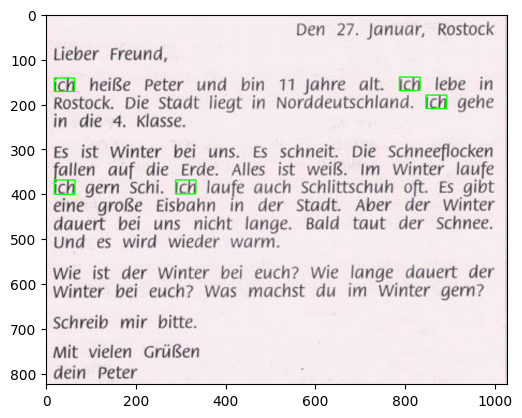

In [ ]:
plt.imsave("all_ich_words.png", image_copy)
plt.imshow(image_copy)
plt.show()

Преобразуем текст в речь и воспроизведем его:

In [ ]:
!pip install gTTS

from gtts import gTTS
import IPython

In [ ]:
print(string)

Den 27. Januar, Rostock
Lieber Freund,

ich heiße Peter und bin 11 jahre alt. Ich lebe in
Rostock. Die Stadt liegt in Norddeutschland. Ich gehe
in die 4. Klasse.

Es ist Winter bei uns. Es schneit. Die Schneeflocken
fallen auf die Erde. Alles ist weiß. Im Winter laufe
ich gern Schi. Ich laufe auch Schlittschuh oft. Es gibt
eine große Eisbahn in der Stadt. Aber der Winter
dauert bei uns nicht lange. Bald taut der Schnee.
Und es wird wieder warm.

wie ist der Winter bei euch? Wie lange dauert der
Winter bei euch? Was machst du im Winter gern?

Schreib mir bitte.

Mit vielen Grüßen
dein Peter



In [ ]:
tts_st = gTTS(string, lang='de') #Обозначили язык нашего текста

with open('sample.mp3', 'wb') as f: #Создали файл в который будем писать звук из текста
    tts_st.write_to_fp(f) #Записываем в файл озвучку текста

IPython.display.Audio('sample.mp3')

Вы можете передать параметр **lang** функциям **image_to_string()** или **image_to_data()**, чтобы упростить распознавание текста на других языках, а не только на английском. Можно использовать функцию **image_to_boxes()**, которая распознает символы и границы их местоположения. (Обратитесь к документации и доступным языкам для получения [дополнительной информации](https://tesseract-ocr.github.io/tessdoc/)).

Обратите внимание: этот метод неплохо подходит для распознавания текста в отсканированных документах.

Однако, это не очень хорошо работает с рукописным текстом, сложными изображениями реального мира и нечеткими изображениями или изображениями, которые **содержат не только текст**.

Попробуем распознавание на французском языке, предварительно установив соответствующий языковой пакет (хотя как и в английском, во французском языке используется латиница, но всё же есть языковые особенности, которые соответствующий пакет помогает учесть):

In [10]:
!sudo apt-get install tesseract-ocr-rus

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr-rus is already the newest version (1:4.00~git30-7274cfa-1.1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


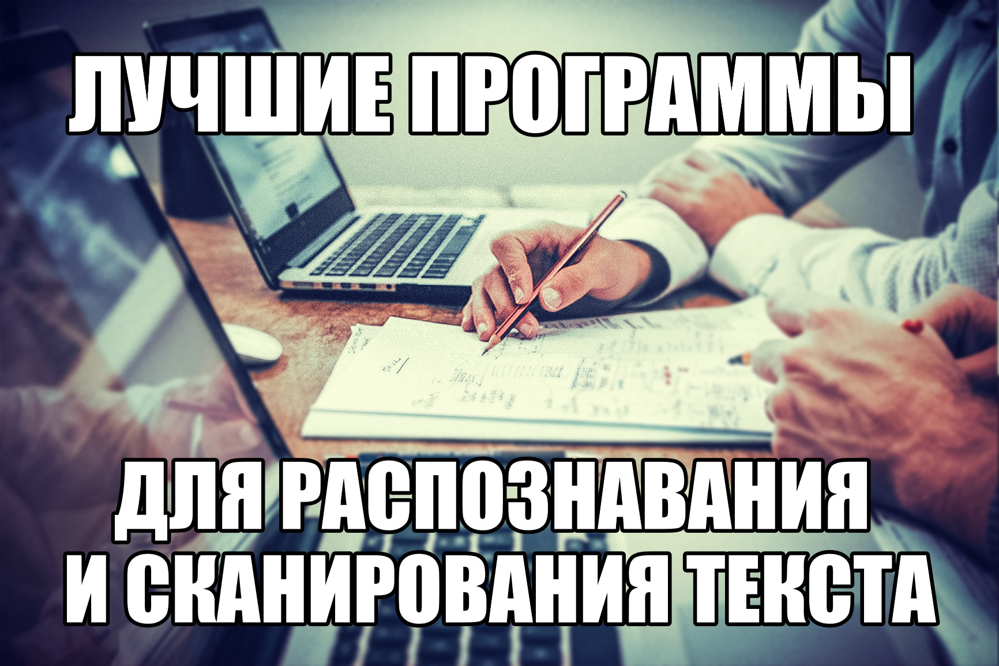

In [84]:
image = open_image('rus_text4.jpg')

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Загрузка изображения
image = cv2.imread('rus_text4.jpg')

# Преобразование в оттенки серого
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Применение адаптивного порогового фильтра
_tmp, threshold = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Применение морфологической операции "закрытие"
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 1))
closed = cv2.morphologyEx(threshold, cv2.MORPH_CLOSE, kernel)

# Поиск контуров текста
contours, _tmp = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Создание маски
blank = np.zeros_like(image)
cv2.drawContours(blank, contours, -1, (255, 255, 255), thickness=cv2.FILLED)

# Применение маски на исходное изображение
result = cv2.bitwise_and(image, blank)

# Отображение результата
#cv2.imshow('Result', result)
cv2.waitKey(0)
cv2.destroyAllWindows()

-------rus_text4.jpg---------


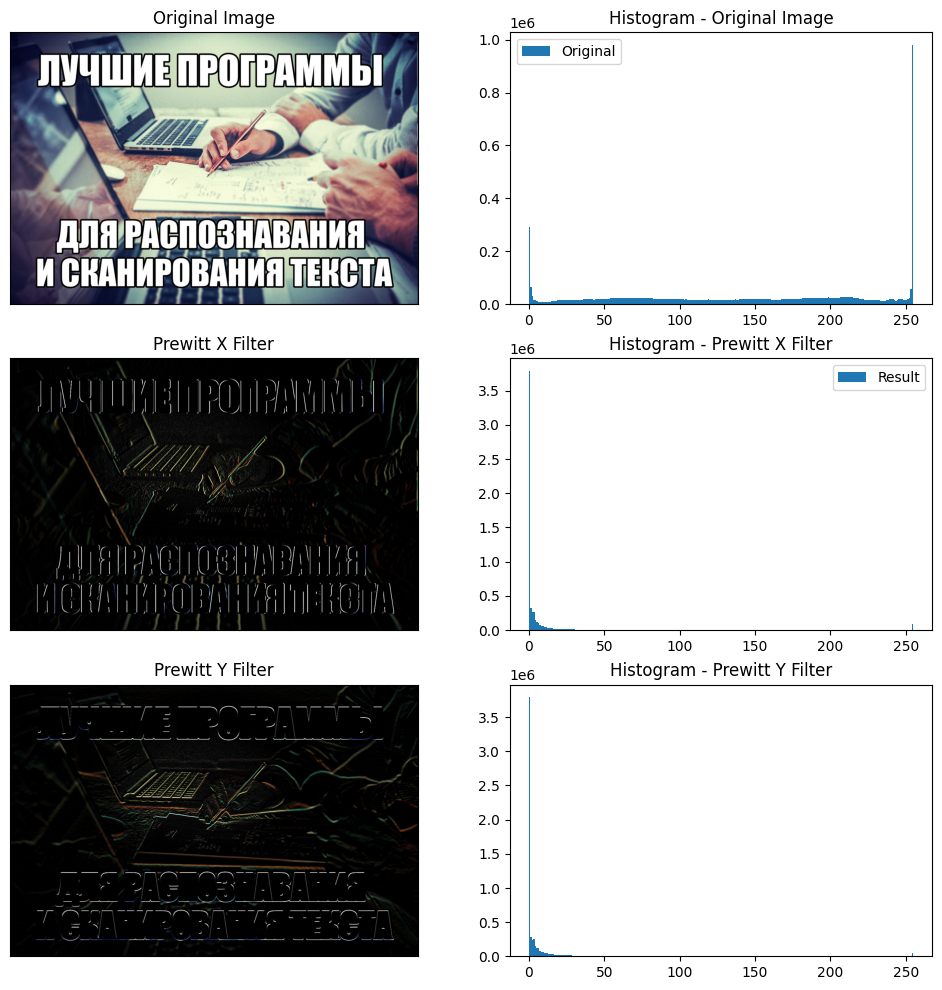

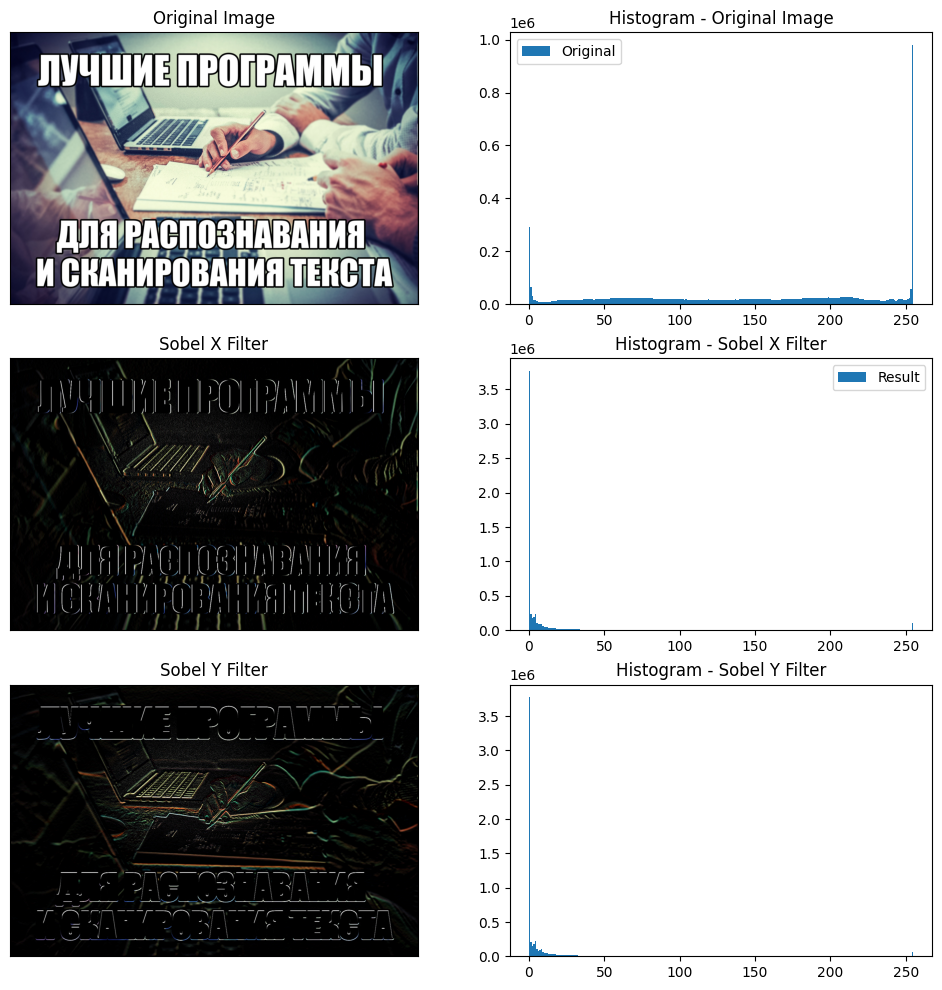

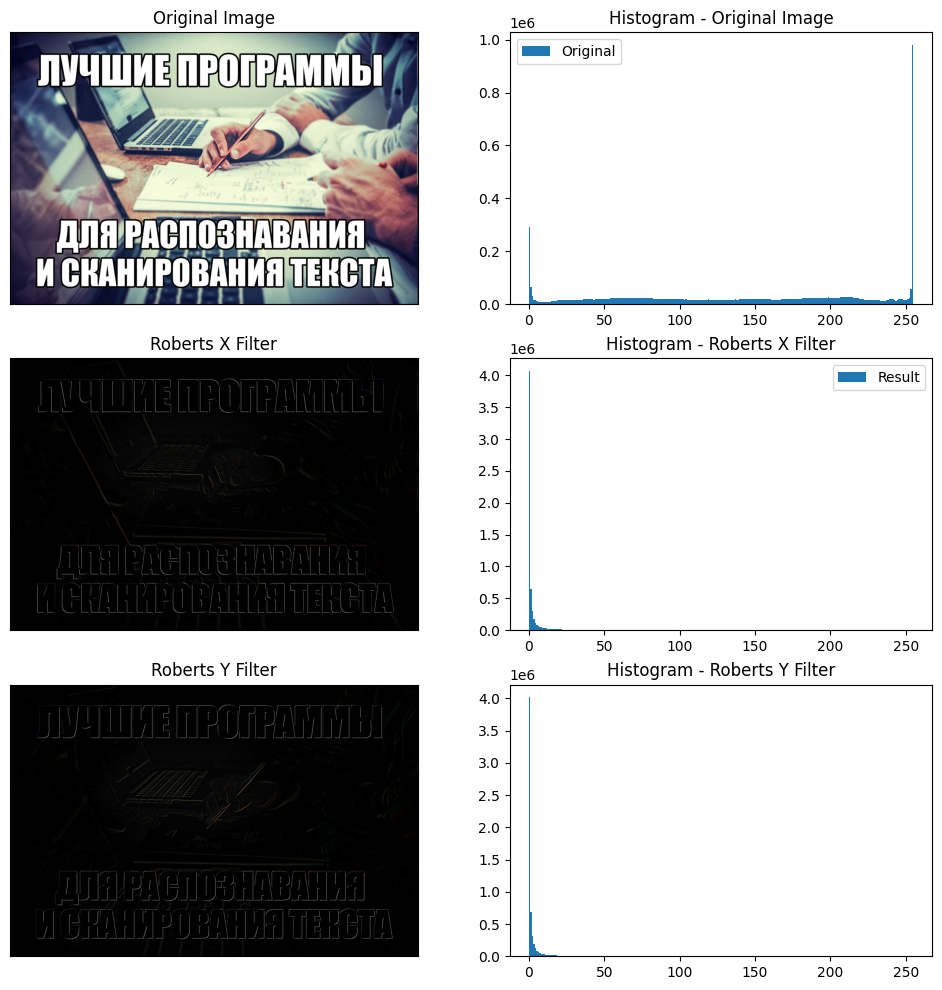

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

# Полный путь к файлу
file_path = 'rus_text4.jpg'

print(f"-------{file_path}---------")

image = cv2.imread(file_path)  # чтение изображения из файла

kernal_size = 3  # размерность ядра фильтра

# Фильтр Превитта
prewitt_x = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]], dtype=np.float32)
prewitt_y = np.array([[-1, -1, -1], [0, 0, 0], [1, 1, 1]], dtype=np.float32)
prewitt_x_image = cv2.filter2D(image, -1, prewitt_x)
prewitt_y_image = cv2.filter2D(image, -1, prewitt_y)

# Фильтр Собеля
sobel_x = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], dtype=np.float32)
sobel_y = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]], dtype=np.float32)
sobel_x_image = cv2.filter2D(image, -1, sobel_x)
sobel_y_image = cv2.filter2D(image, -1, sobel_y)

# Фильтр Робертса
roberts_x = np.array([[0, 1], [-1, 0]], dtype=np.float32)
roberts_y = np.array([[1, 0], [0, -1]], dtype=np.float32)
roberts_x_image = cv2.filter2D(image, -1, roberts_x)
roberts_y_image = cv2.filter2D(image, -1, roberts_y)

# Вывод результатов--------------------Превитта---------------------------------------------------
plt.figure(figsize=(12, 12))

# Оригинальное изображение
plt.subplot(3, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.xticks([])
plt.yticks([])

# Гистограмма оригинального изображения
plt.subplot(3, 2, 2)
plt.hist(np.ravel(image), bins=256, label='Original')
plt.title("Histogram - Original Image")
plt.legend()

# Фильтр Превитта X
plt.subplot(3, 2, 3)
plt.imshow(cv2.cvtColor(prewitt_x_image, cv2.COLOR_BGR2RGB))
plt.title("Prewitt X Filter")
plt.xticks([])
plt.yticks([])

# Гистограмма фильтра Превитта X
plt.subplot(3, 2, 4)
plt.hist(np.ravel(prewitt_x_image), bins=256, label='Result')
plt.title("Histogram - Prewitt X Filter")
plt.legend()

# Фильтр Превитта Y
plt.subplot(3, 2, 5)
plt.imshow(cv2.cvtColor(prewitt_y_image, cv2.COLOR_BGR2RGB))
plt.title("Prewitt Y Filter")
plt.xticks([])
plt.yticks([])

# Гистограмма фильтра Превитта Y
plt.subplot(3, 2, 6)
plt.hist(np.ravel(prewitt_y_image), bins=256, label='Result')
plt.title("Histogram - Prewitt Y Filter")
plt.show()

# Вывод результатов--------------------Собеля---------------------------------------------------
plt.figure(figsize=(12, 12))

# Оригинальное изображение
plt.subplot(3, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.xticks([])
plt.yticks([])

# Гистограмма оригинального изображения
plt.subplot(3, 2, 2)
plt.hist(np.ravel(image), bins=256, label='Original')
plt.title("Histogram - Original Image")
plt.legend()

# Фильтр Собеля X
plt.subplot(3, 2, 3)
plt.imshow(cv2.cvtColor(sobel_x_image, cv2.COLOR_BGR2RGB))
plt.title("Sobel X Filter")
plt.xticks([])
plt.yticks([])

# Гистограмма фильтра Собеля X
plt.subplot(3, 2, 4)
plt.hist(np.ravel(sobel_x_image), bins=256, label='Result')
plt.title("Histogram - Sobel X Filter")
plt.legend()

# Фильтр Собеля Y
plt.subplot(3, 2, 5)
plt.imshow(cv2.cvtColor(sobel_y_image, cv2.COLOR_BGR2RGB))
plt.title("Sobel Y Filter")
plt.xticks([])
plt.yticks([])

# Гистограмма фильтра Собеля Y
plt.subplot(3, 2, 6)
plt.hist(np.ravel(sobel_y_image), bins=256, label='Result')
plt.title("Histogram - Sobel Y Filter")
plt.show()

# Вывод результатов--------------------Робертса---------------------------------------------------
plt.figure(figsize=(12, 12))

# Оригинальное изображение
plt.subplot(3, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.xticks([])
plt.yticks([])

# Гистограмма оригинального изображения
plt.subplot(3, 2, 2)
plt.hist(np.ravel(image), bins=256, label='Original')
plt.title("Histogram - Original Image")
plt.legend()

# Фильтр Робертса X
plt.subplot(3, 2, 3)
plt.imshow(cv2.cvtColor(roberts_x_image, cv2.COLOR_BGR2RGB))
plt.title("Roberts X Filter")
plt.xticks([])
plt.yticks([])

# Гистограмма фильтра Робертса X
plt.subplot(3, 2, 4)
plt.hist(np.ravel(roberts_x_image), bins=256, label='Result')
plt.title("Histogram - Roberts X Filter")
plt.legend()

# Фильтр Робертса Y
plt.subplot(3, 2, 5)
plt.imshow(cv2.cvtColor(roberts_y_image, cv2.COLOR_BGR2RGB))
plt.title("Roberts Y Filter")
plt.xticks([])
plt.yticks([])

# Гистограмма фильтра Робертса Y
plt.subplot(3, 2, 6)
plt.hist(np.ravel(roberts_y_image), bins=256, label='Result')
plt.title("Histogram - Roberts Y Filter")
plt.show()

In [ ]:
def draw_image3(image, imageNew, n, i):
 plt.figure(figsize=(16,13), dpi=90)
 plt.subplot2grid((3,3), (0,0)) # 1 - исходное изображение
 plt.imshow(image) # Вывод
 plt.title('Исходное изображение')
 plt.subplot2grid((3,3), (0,1)) # 2 - преобразованное изображение
 plt.imshow(imageNew) # Вывод
 plt.title('Преобразованное изображение')
 #Гистограммы двух изображений
 plt.subplot2grid((3,3), (0,2))
 plt.hist(np.ravel(image), bins=256, label=['Оригинал'])
 plt.hist(np.ravel(imageNew), bins=256, label=['Результат'])
 plt.title('Гистограмма интенсивности цвета\n n=%d,i=%d'%(n,i))
 plt.legend()
 plt.show()


In [77]:
#Дилатация
#Используем структурные элементы: прямоугольник, крест, эллипс
def dilate1(n, i): # Прямоугольник
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (n, n)) #Используем структурный элемент - прямоугольник, его заполняют единички матрицой n на n
  transform_img = cv2.dilate(gray, kernel, iterations = i)
  draw_image3(gray, transform_img, n, i)

def dilate2(n, i): # Крест
  kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (n, n))
  transform_img = cv2.dilate(gray, kernel, iterations = i)
  draw_image3(gray, transform_img, n, i)

def dilate3(n, i): # Эллипс
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (n, n))
  transform_img = cv2.dilate(gray, kernel, iterations = i)
  draw_image3(gray, transform_img, n, i)

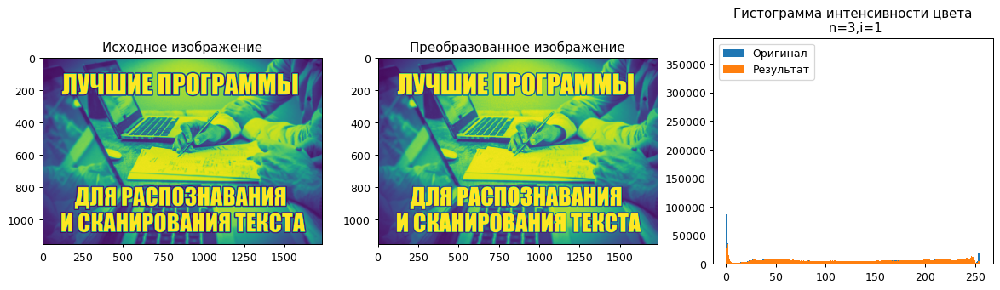

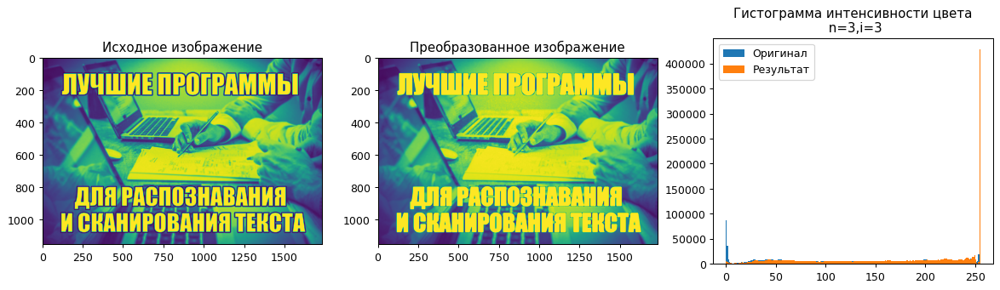

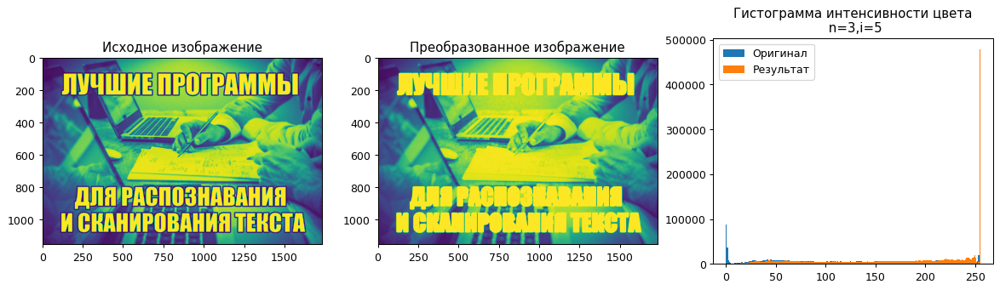

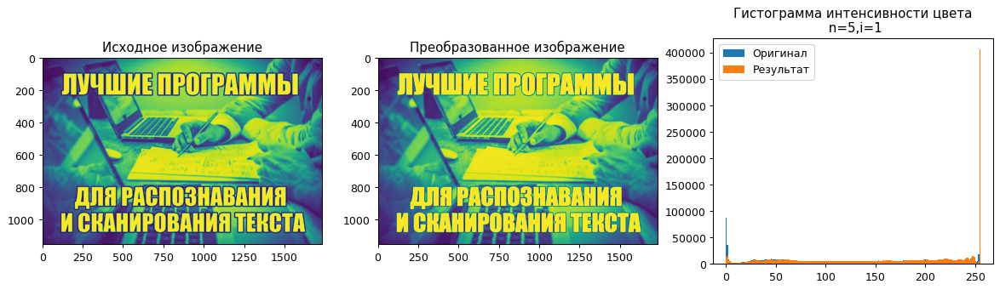

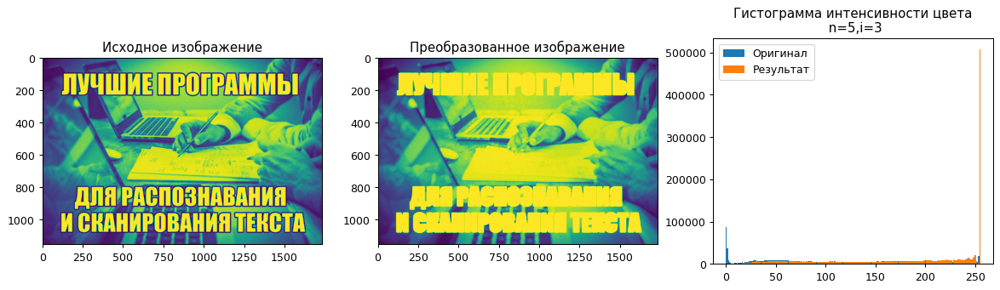

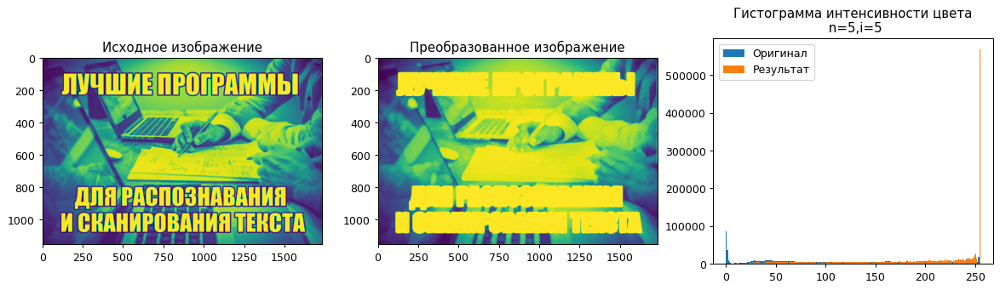

In [80]:
# Прямоугольник
for n in range(3, 6, 2):
  for i in range(1, 6, 2):
    dilate3(n, i)

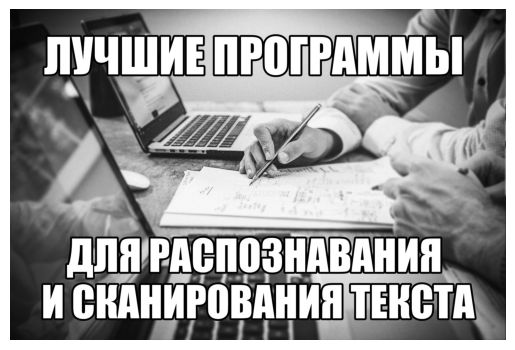

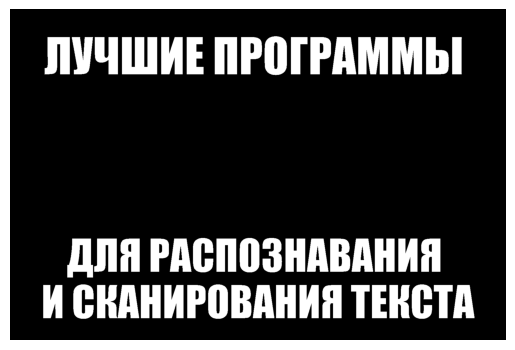

In [103]:
import cv2
import numpy as np

# Загрузка изображения
image = cv2.imread('rus_text4.jpg')

# Разделение изображения на каналы BGR
b, g, r = cv2.split(image)

# Пороговая фильтрация для красного канала
_, red_threshold = cv2.threshold(r, 240, 255, cv2.THRESH_BINARY)

# Пороговая фильтрация для синего канала
_, blue_threshold = cv2.threshold(b, 240, 255, cv2.THRESH_BINARY)

# Объединение бинарных масок
result = cv2.bitwise_and(red_threshold, blue_threshold)

# Отображение результата с помощью matplotlib
plt.imshow(cv2.cvtColor(gray, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Отображение результата с помощью matplotlib
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

#cv2.imshow('Original', gray)
#cv2.imshow('Equalized', equalized)
#cv2.imshow('CLAHE', clahe_applied)
#cv2.waitKey(0)
#cv2.destroyAllWindows()

In [ ]:

# Отображение результата с помощью matplotlib
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

In [105]:

# Преобразование изображения в оттенки серого
#gray = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)

# Распознавание текста с помощью pytesseract
string = pytesseract.image_to_string(result, lang='rus')
print(string)# печатаем

ЛУЧШИЕ ПРОГРАММЫ

Е
И СКАНИРОВАНИЯ ТЕКСТА



In [107]:
tts_st = gTTS(string, lang='ru') #Обозначили язык нашего текста

with open('sample.mp3', 'wb') as f: #Создали файл в который будем писать звук из текста
    tts_st.write_to_fp(f) #Записываем в файл озвучку текста

IPython.display.Audio('sample.mp3')

Качество распознавания неплохое, есть мелкие недочеты. А теперь ситуация, когда текст внутри картинки.

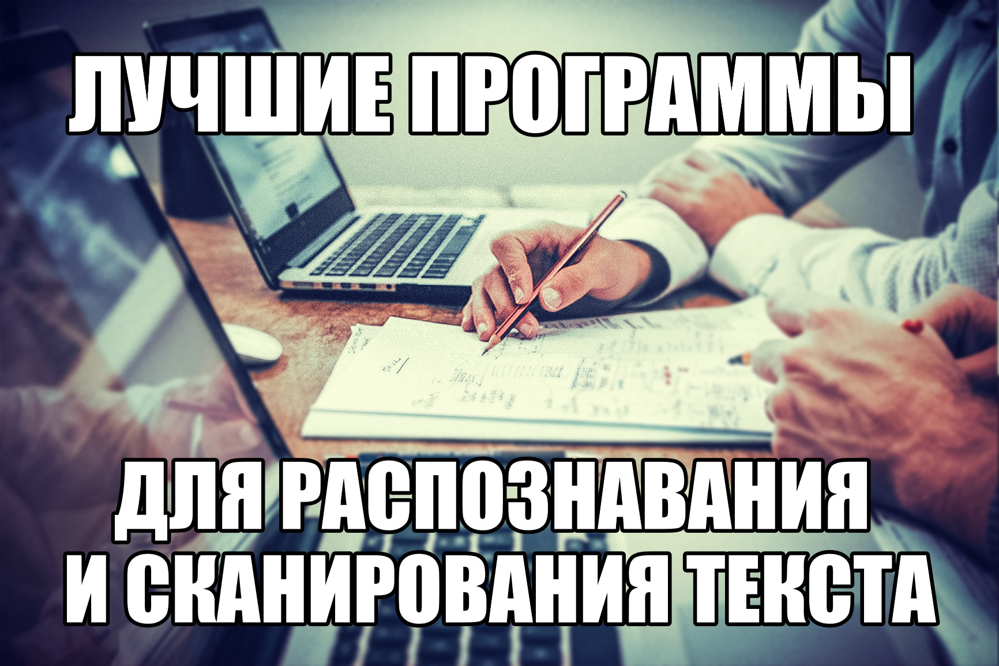

In [108]:
image = open_image('rus_text4.jpg')

In [109]:
string = pytesseract.image_to_string(image, lang='rus') # получаем строку

print(string)# печатаем

а я ы . и
ПЕЛА
И ТИ НЧАГ
[

 



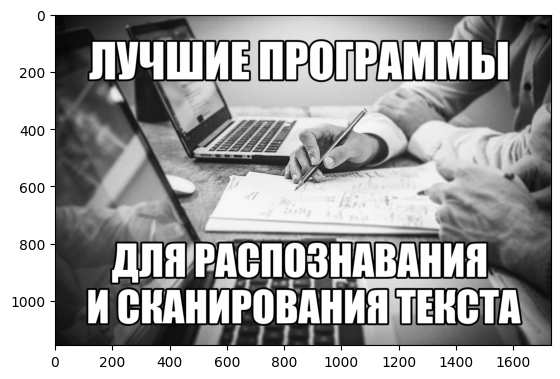

In [110]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_image, cmap='gray')
plt.show()

In [111]:
string = pytesseract.image_to_string(gray_image, lang='rus') # получаем строку

print(string)# печатаем

ПДА
7 №2 ` м%

 



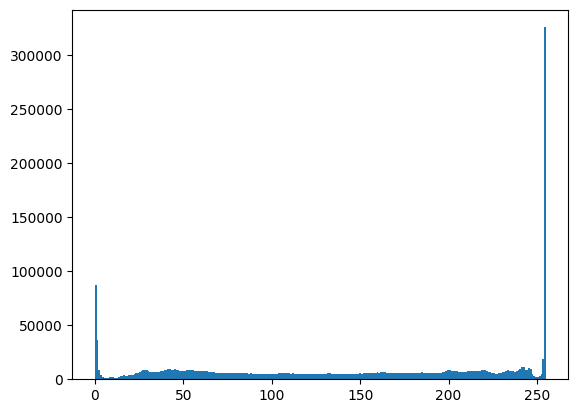

In [112]:
plt.hist(np.ravel(gray_image), bins=256)
plt.show()

In [113]:
img = np.array(gray_image)
img = np.where(img > 244, 0, 255)

cv2.imwrite('bin_image.jpg', img)

True

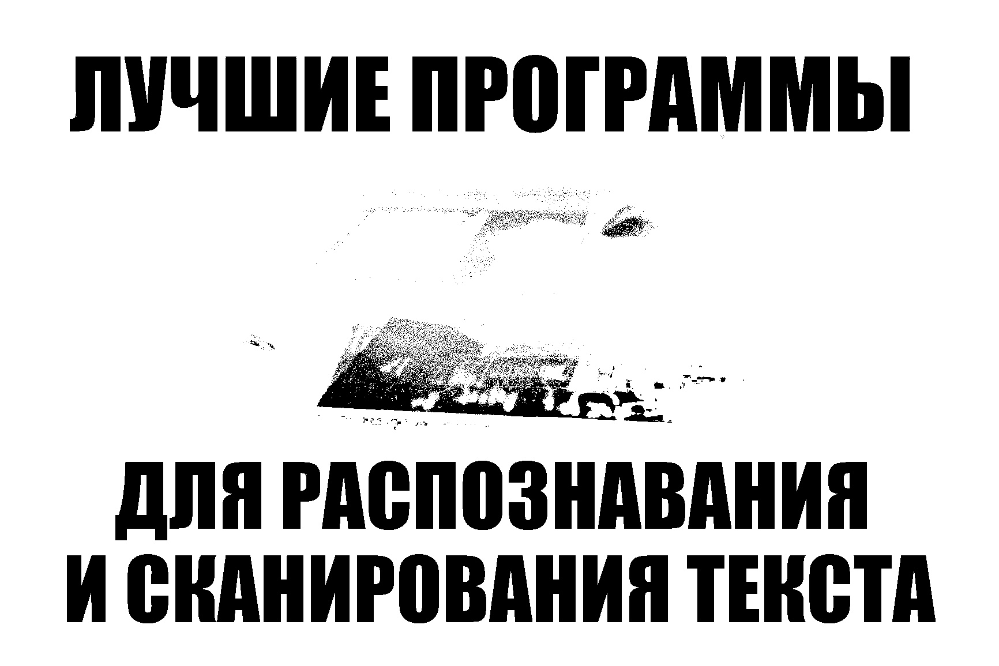

In [114]:
image = open_image('bin_image.jpg')

In [ ]:
!ls

In [116]:
string = pytesseract.image_to_string(image, lang='rus') # получаем строку

print(string)# печатаем

ЛУЧШИЕ ПРОГРАММЫ

 

ДЛЯ РАСПОЗНАВАНИЯ
И СКАНИРОВАНИЯ ТЕКСТА



Как видно из последнего примера, действительно, если изображение содержит не только текст, результат может быть неудовлетворительным, по крайней мере без предварительной обработки.


Попробуем теперь распознать рукописный текст, подготовленный в графическом редакторе:

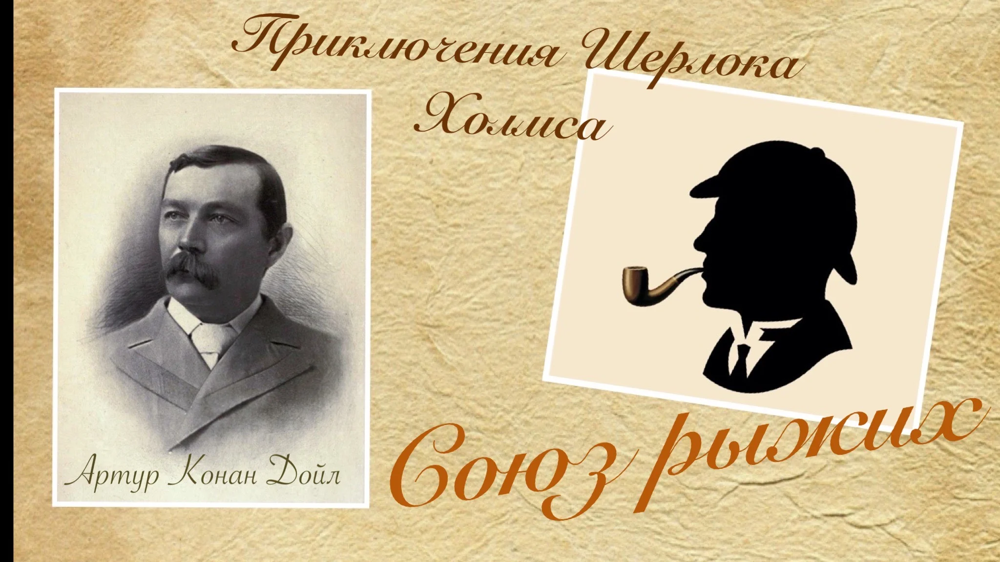

   

  

Артур а онан “Лойл (

 



In [130]:
image = open_image('rus_text1.jpg')
string = pytesseract.image_to_string(image, lang='rus') # получаем строку

print(string)# печатаем

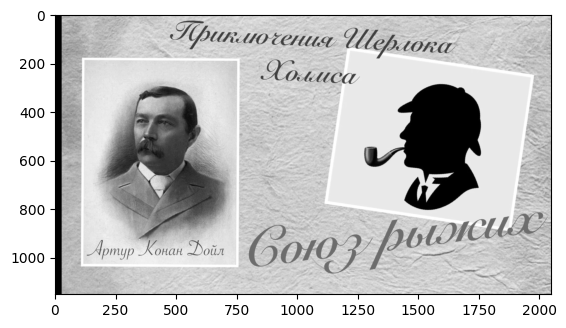

In [131]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_image, cmap='gray')
plt.show()


In [132]:
string = pytesseract.image_to_string(gray_image, lang='rus') # получаем строку
print(string)# печатаем

      
 

Я ртур

к Э а ый |
ВИ
_Конан “Лойл бою реиие



In [148]:
img = np.array(gray_image)
img = np.where(img > 150, 0, 255)

cv2.imwrite('bin_image.jpg', img)

True

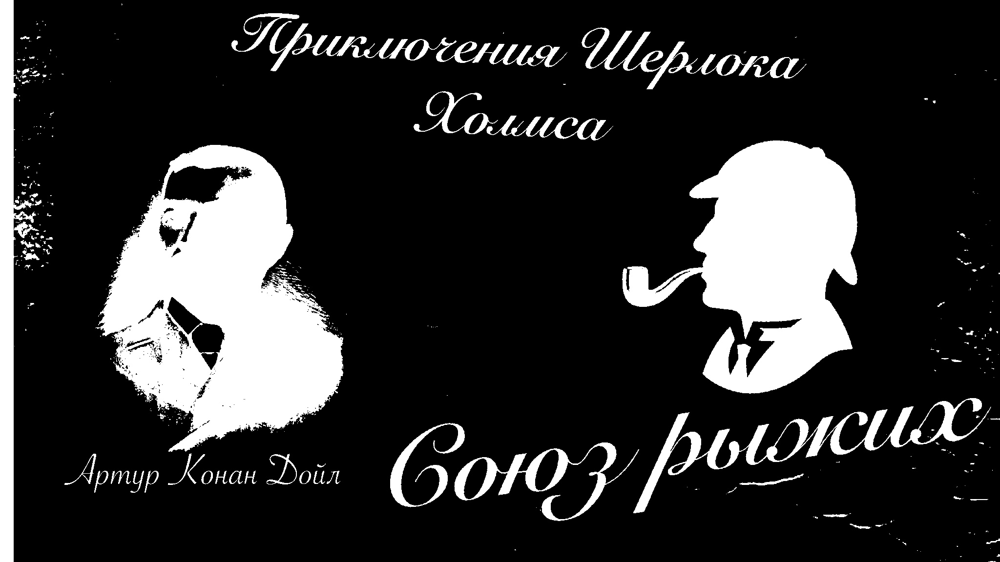

In [149]:
image = open_image('bin_image.jpg')

In [150]:
string = pytesseract.image_to_string(image, lang='rus') # получаем строку
print(string)# печатаем

      
 

Артур Ио мт. АЖ

 



In [162]:
string = pytesseract.image_to_string(255 - image, lang='rus') # получаем строку из негатива
print(string)# печатаем

      
 

Артур = онан Лойл (010

 



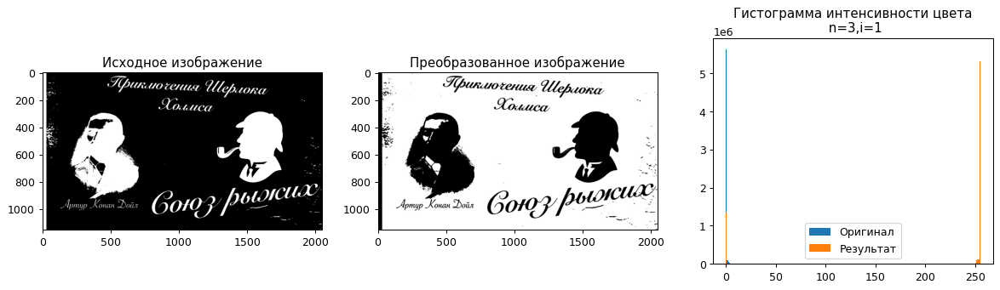

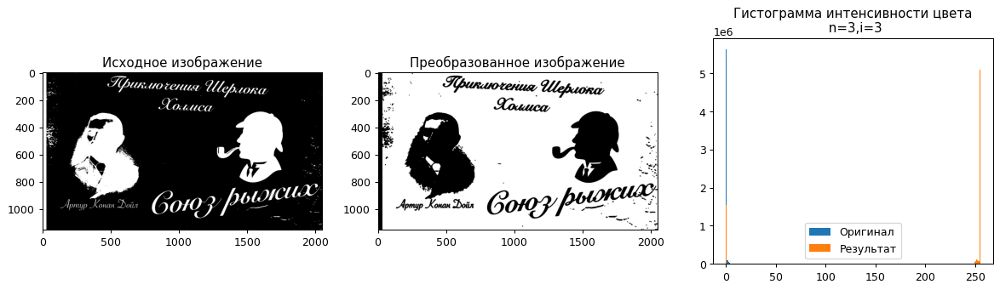

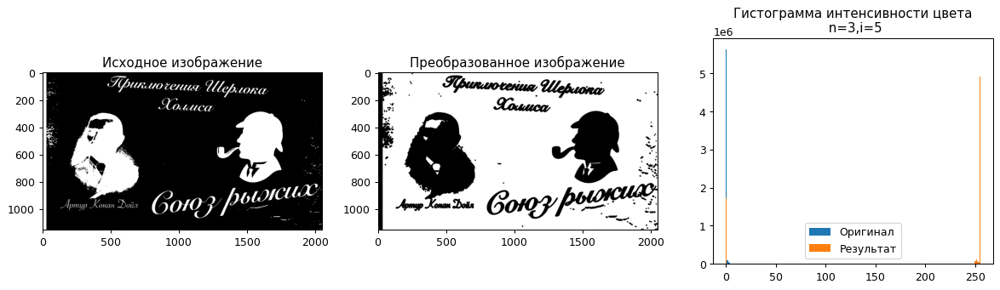

 

= рам ой (2. 007)



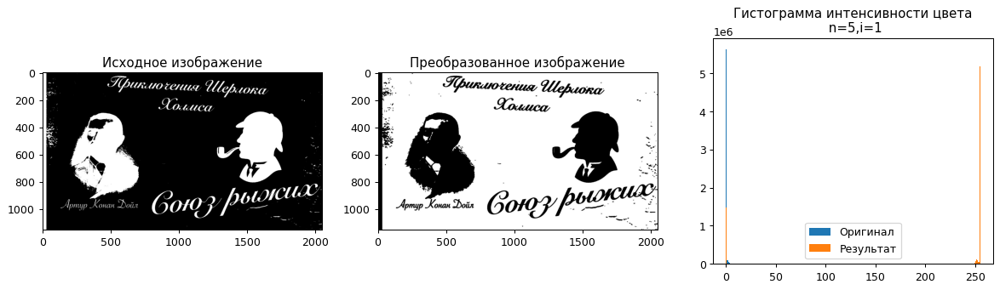

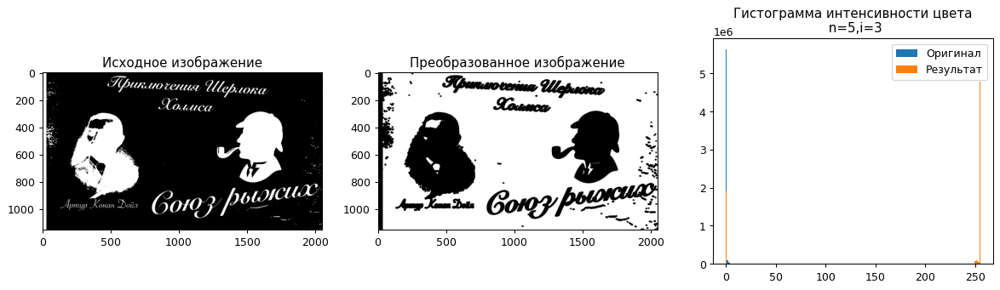

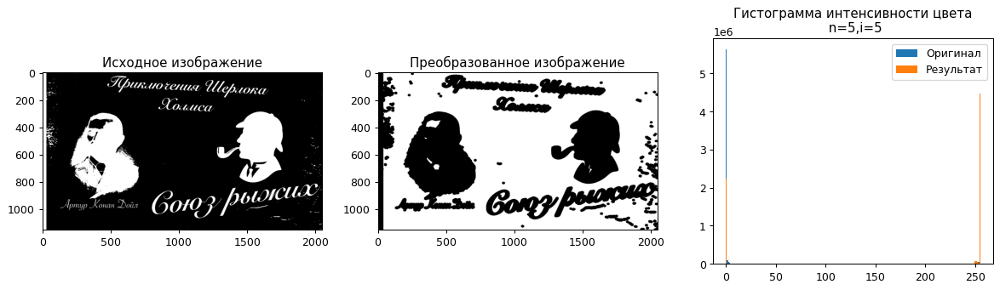

In [161]:
#Дилатация
#Используем структурные элементы: прямоугольник, крест, эллипс
def dilate1(n, i): # Прямоугольник
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (n, n)) #Используем структурный элемент - прямоугольник, его заполняют единички матрицой n на n
  transform_img = cv2.dilate(image, kernel, iterations = i)
  string = pytesseract.image_to_string(transform_img, lang='rus') # получаем строку
  print(string)# печатаем
  draw_image3(image, transform_img, n, i)

def dilate2(n, i): # Крест
  kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (n, n))
  transform_img = cv2.dilate(image, kernel, iterations = i)
  string = pytesseract.image_to_string(transform_img, lang='rus') # получаем строку
  print(string)# печатаем
  draw_image3(image, transform_img, n, i)

def dilate3(n, i): # Эллипс
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (n, n))
  transform_img = cv2.dilate(image, kernel, iterations = i)
  # Инвертирование значений пикселей
  negative = 255 - transform_img

  string = pytesseract.image_to_string(negative, lang='rus') # получаем строку
  print(string)# печатаем
  draw_image3(image, negative, n, i)

  # Прямоугольник
for n in range(3, 6, 2):
  for i in range(1, 6, 2):
    dilate3(n, i)

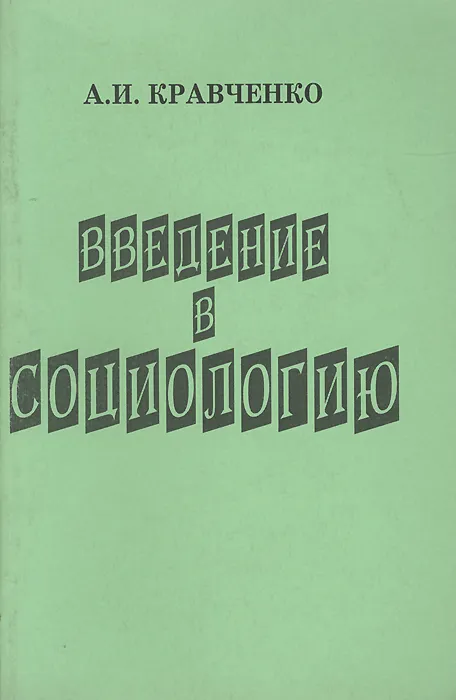

ВНИИ
поро



In [202]:
image = open_image('rus_text3.jpg')
string = pytesseract.image_to_string(image, lang='rus') # получаем строку

print(string)# печатаем

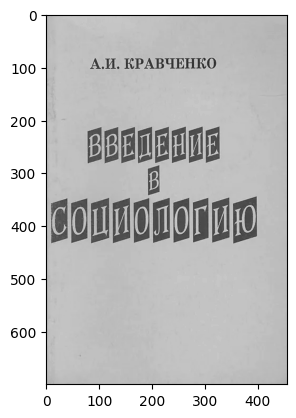

In [203]:
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
plt.imshow(gray_image, cmap='gray')
plt.show()


In [204]:
string = pytesseract.image_to_string(gray_image, lang='rus') # получаем строку
print(string)# печатаем

ВВИННИЕ
Чон



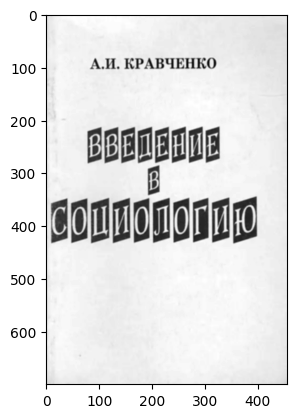

In [205]:
# Применение фильтра Гаусса
filtered = cv2.GaussianBlur(gray_image, (5, 5), 0)
plt.imshow(filtered, cmap='gray')
plt.show()

In [206]:
string = pytesseract.image_to_string(gray_image, lang='rus') # получаем строку
print(string)# печатаем

ВВИННИЕ
Чон



In [213]:
img = np.array(gray_image)
img = np.where(img > 110, 0, 255)

cv2.imwrite('bin_image.jpg', img)

True

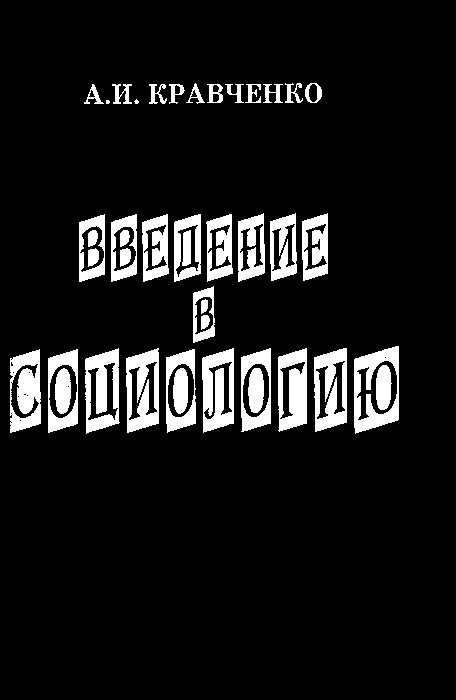

In [214]:
image = open_image('bin_image.jpg')

In [212]:
string = pytesseract.image_to_string(image, lang='rus') # получаем строку
print(string)# печатаем

А.И. КРАВЧЕНКО

СОЩиЮЛОГИЮ



In [215]:
string = pytesseract.image_to_string(255 - image, lang='rus') # получаем строку из негатива
print(string)# печатаем

А.И. КРАВЧЕНКО

ВАВТ
И



А.И. КРАВЧЕНКО

парить
И



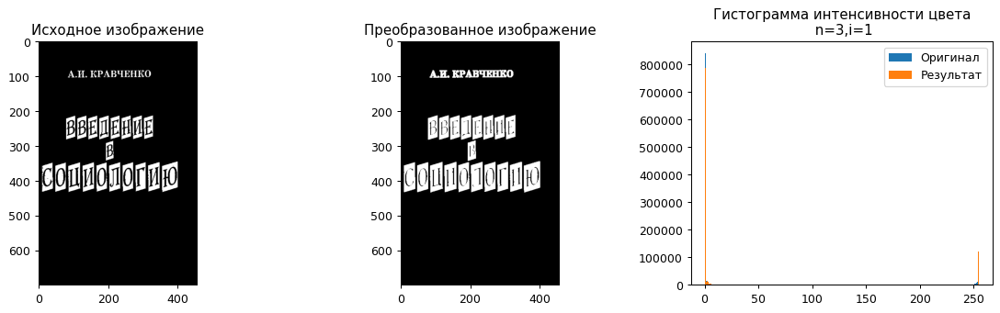

„9

 



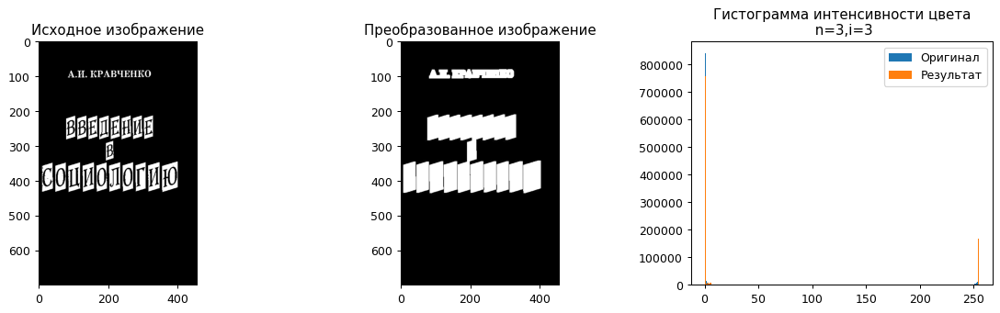

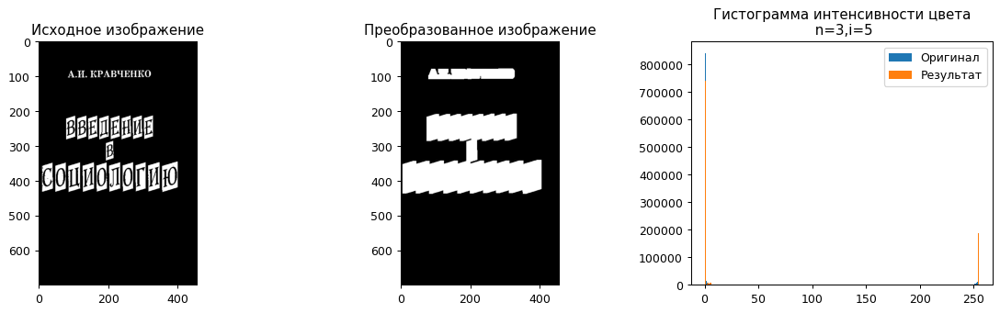

А.И. КРАВЧЕНКО

 

И



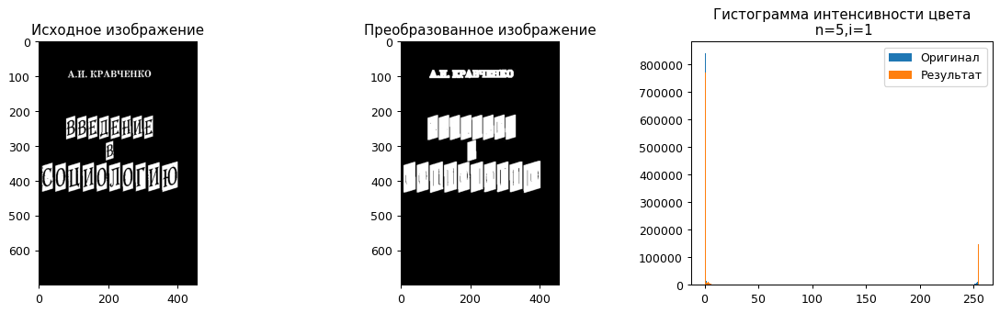

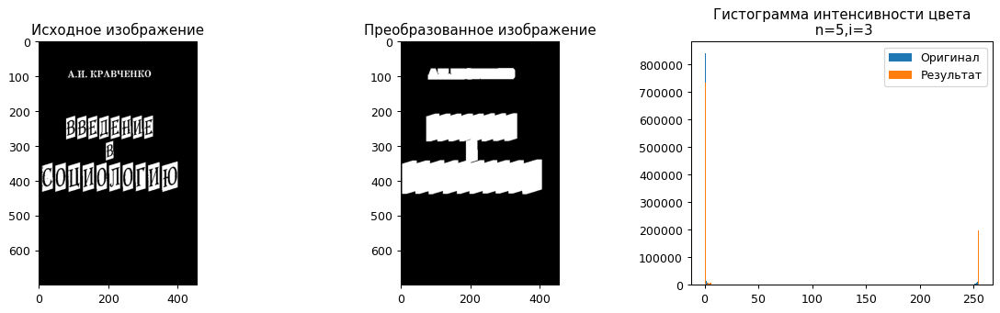

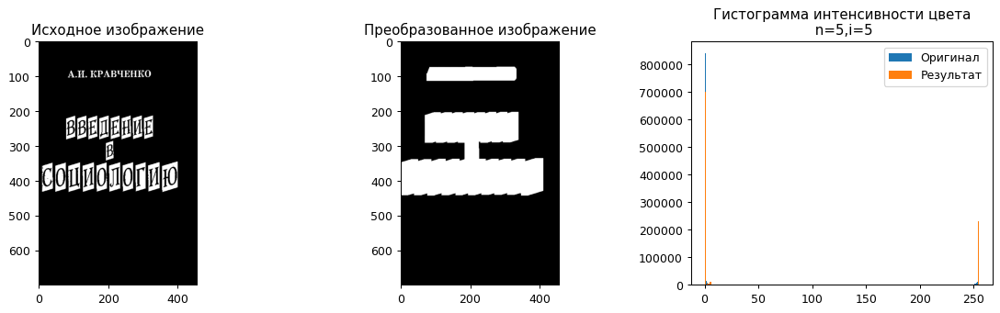

In [218]:
#Дилатация
#Используем структурные элементы: прямоугольник, крест, эллипс
def dilate1(n, i): # Прямоугольник
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (n, n)) #Используем структурный элемент - прямоугольник, его заполняют единички матрицой n на n
  transform_img = cv2.dilate(image, kernel, iterations = i)
  string = pytesseract.image_to_string(transform_img, lang='rus') # получаем строку
  print(string)# печатаем
  draw_image3(image, transform_img, n, i)

def dilate2(n, i): # Крест
  kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (n, n))
  transform_img = cv2.dilate(image, kernel, iterations = i)
  string = pytesseract.image_to_string(transform_img, lang='rus') # получаем строку
  print(string)# печатаем
  draw_image3(image, transform_img, n, i)

def dilate3(n, i): # Эллипс
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (n, n))
  transform_img = cv2.dilate(image, kernel, iterations = i)
  # Инвертирование значений пикселей
  #negative = 255 - transform_img

  string = pytesseract.image_to_string(transform_img, lang='rus') # получаем строку
  print(string)# печатаем

  draw_image3(image, transform_img, n, i)

  # Прямоугольник
for n in range(3, 6, 2):
  for i in range(1, 6, 2):
    dilate1(n, i)

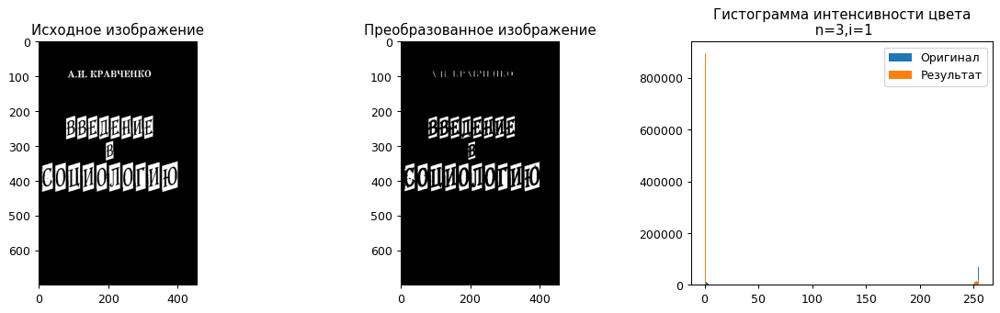

А
А
\--\
—\,
\=`
АА
\--\
А



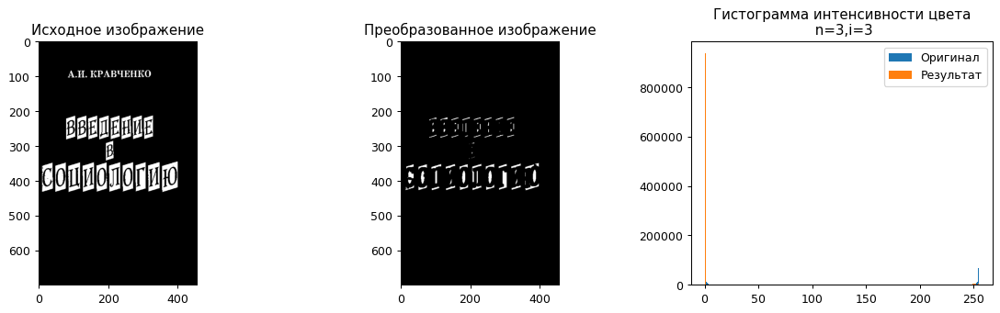

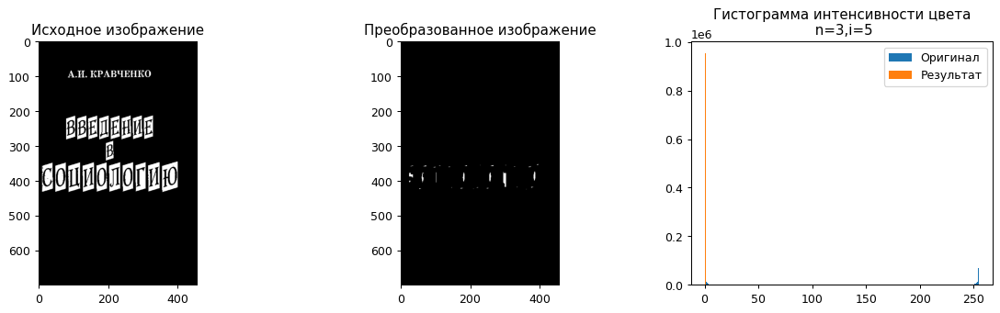

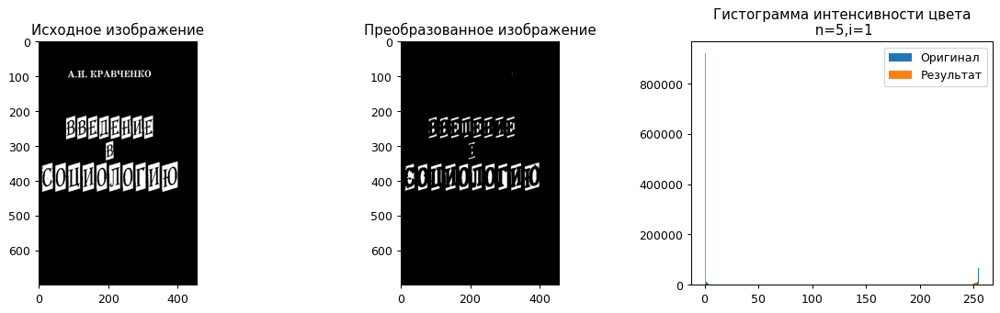

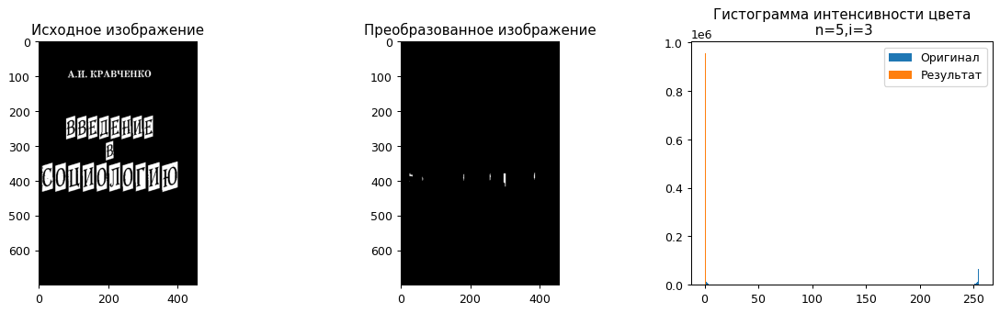

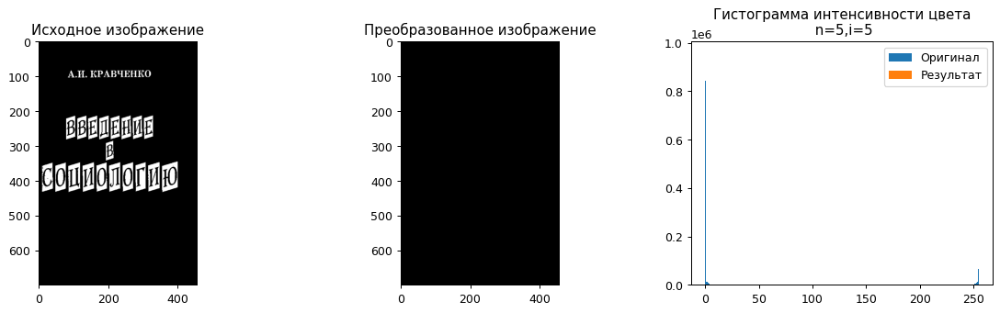

In [220]:
def eroz1(n, i): # Прямоугольник
  kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (n, n))
  transform_img = cv2.erode(image, kernel, iterations = i)
  string = pytesseract.image_to_string(transform_img, lang='rus') # получаем строку
  print(string)# печатаем
  draw_image3(image, transform_img, n, i)

def eroz2(n, i): # Крест
  kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (n, n))
  transform_img = cv2.erode(image, kernel, iterations = i)
  string = pytesseract.image_to_string(transform_img, lang='rus') # получаем строку
  print(string)# печатаем
  draw_image3(image, transform_img, n, i)

def eroz3(n, i): # Эллипс
  kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (n, n))
  transform_img = cv2.erode(image, kernel, iterations = i)
  string = pytesseract.image_to_string(transform_img, lang='rus') # получаем строку
  print(string)# печатаем
  draw_image3(image, transform_img, n, i)

  # Прямоугольник
for n in range(3, 6, 2):
  for i in range(1, 6, 2):
    eroz1(n, i)

Последние несколько примеров демонстрируют, что в ряде случаев для успешного распознавания текста нужна предварительная обработка изображения.

## Работа с отсканированным документом в формате PDF

Чтобы извлечь изображение со страницы pdf-файла можно использовать библиотеку **PyMuPDF**(импортируется как **fitz**) с преобразованием в понятный **Open Cv** формат при помощи массивов **numpy**. Установим необходимые библиотеки:

In [1]:
!pip install fitz
!pip install PyMuPDF

  Using cached PyMuPDF-1.24.1-cp310-none-manylinux2014_x86_64.whl (3.9 MB)
  Using cached PyMuPDFb-1.24.1-py3-none-manylinux2014_x86_64.manylinux_2_17_x86_64.whl (30.8 MB)


In [2]:
import fitz

Определим функцию для извлечения 1-й страницы pdf-документа и ее отображения в блокноте:

In [3]:
!ls

all_ich_words.png  pdf1.pdf		  qr_code.png  rus_text1.jpg  rus_text4.jpg
bin_image.jpg	   pdf2.pdf		  qr.jpg       rus_text2.jpg  sample_data
de_text1.png	   portal.edu.asu.ru.png  RickAstley   rus_text3.jpg  sample.mp3


In [4]:
def reader_pdf(file):
    doc = fitz.open(file)
    page = doc.load_page(0) # Загружается 1-я страница pdf-файла (индекс 0)
    pix = page.get_pixmap()
    image = np.frombuffer(pix.samples, dtype=np.uint8).reshape(pix.h, pix.w, pix.n) # Получаем изображение для дальнейшего распознавания
    cv2_imshow(image)
    return image

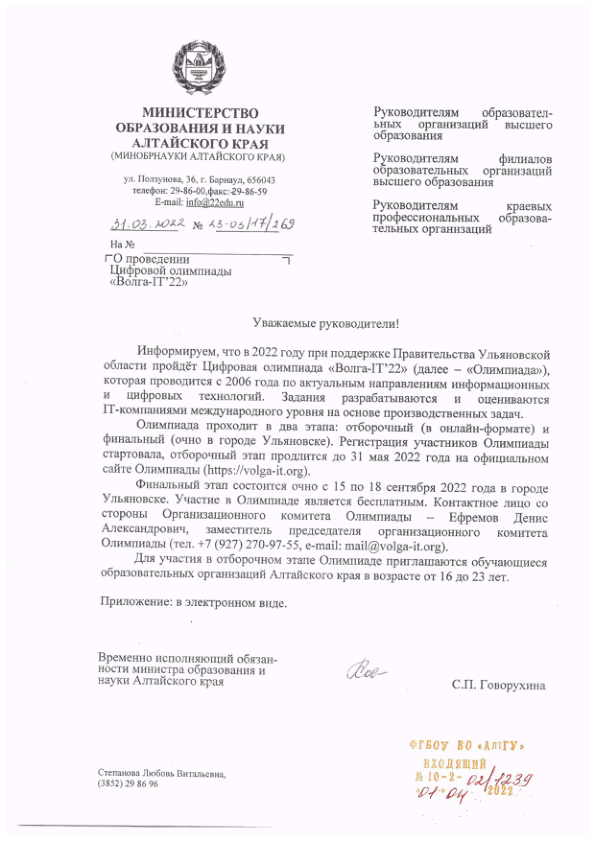

In [7]:
file = 'pdf1.pdf'
image = reader_pdf(file)

In [12]:
import pytesseract
recognized_text = pytesseract.image_to_string(image,lang="rus")
print(recognized_text)

водителям образовател-
ТЕР ай

ОБРАЗОВАНИЯ И НАУКИ образования
АЛТАЙСКОГО КРАЯ
(МИНОБРНАУКИ АЛТАЙСКОГО КРАЯ). Руховодителяы ‘филиалов
образовательных организаций
злу 36 Баужнов ыешего образований
я
"Елоы ШыфЗейыи Руководителям. краевых.
В.о. мова № дало] 69 а во
на
ГО проветенян
ово одиминады
ЗВаме

 

`Уважаемые руководители!

Информируем, что в 2022 году при поддержке Правительства Ульяновской
области пройдёт Цифровая олимпиада «Волга-1Т”22» (далее — «Олимпиадь»),
которая проводится с 2006 года по актуальным направлениям ниформационных
и цифровых технологий. Задания разрабатываются и оцениваются
|П-компаниями международного уровня на основе производственных задач.

Олимпиада проходит в два этапа: отборочный (в онлайн-формате) и
финальный (очно в городе Ульяновске). Регистрация участников Олимпиады:
стартовала, отборочный этап продлится до 31 мая 2022 года на официальном
<айте Олимпиады (нирз/ова-И.оге).

Финальный этап состоится очно с 15 по 18 сентября 2022 года в городе
Ульяновске.

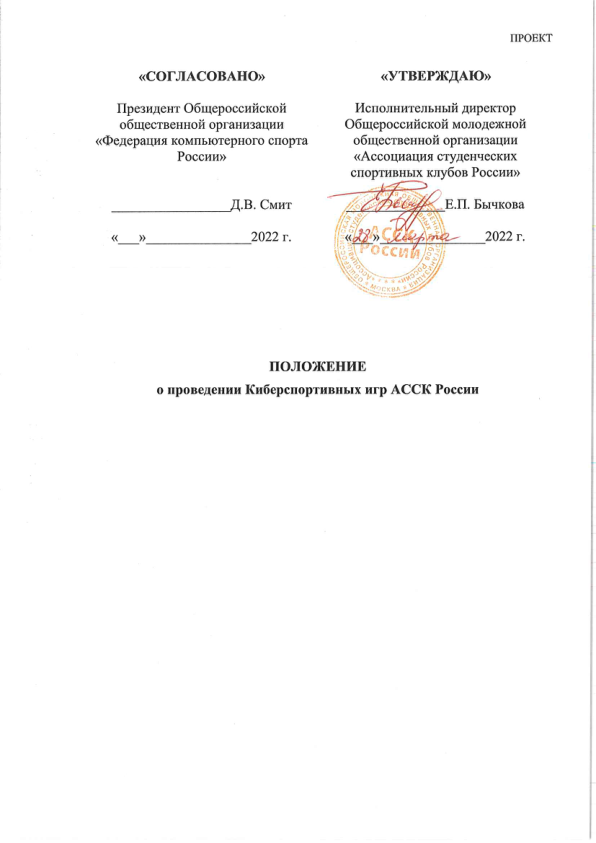

пРОВКТ

«СОГЛАСОВАНО» «УТВЕРЖДАЮ»
Президент Общероссийской Исполнительный директор

общественной организации Общероссийской молодежной
«Федерация компьютерного спорта. общественной организации
России» «Ассоциация студенческих

спортивных клубов России»
>

ДВ. Смит
2022 г.

  

ПОЛОЖЕНИЕ
о проведении Киберспортивных игр АССК России



In [13]:
file = 'pdf2.pdf'
image = reader_pdf(file)
recognized_text = pytesseract.image_to_string(image, lang="rus+eng")
print(recognized_text)

In [14]:
pip install PyPDF2


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 232.6/232.6 kB 2.6 MB/s eta 0:00:00


In [21]:
import fitz
import pytesseract
from PIL import Image

# Open the PDF file
file = 'pdf2.pdf'
pdf = fitz.open(file)

# Перебор каждой страницы в PDF
for page_num in range(pdf.page_count):
    # Получаем текущую страницу
    page = pdf[page_num]

    # Преобразуем страницу в объект PIL Image
    pix = page.get_pixmap()
    image = Image.frombytes("RGB", [pix.width, pix.height], pix.samples)

    # Извлекаем текст
    recognized_text = pytesseract.image_to_string(image, lang="rus+eng")

    # Выводим полученный текст
    print(f"Page {page_num + 1}:\n{recognized_text}\n")

Page 1:
пРОВКТ

«СОГЛАСОВАНО» «УТВЕРЖДАЮ»
Президент Общероссийской Исполнительный директор

общественной организации Общероссийской молодежной
«Федерация компьютерного спорта. общественной организации
России» «Ассоциация студенческих

спортивных клубов России»
>

ДВ. Смит
2022 г.

  

ПОЛОЖЕНИЕ
о проведении Киберспортивных игр АССК России


Page 2:
1. ОБЩИЕ ПОЛОЖЕНИЯ

Киберспортивные игры АССК России среди студенческих спортивных клубов
(далее — Турнир) проводятся в целях организации досуговой сорсвновательной
деятельности среди студентов, а также развития и популяризации массового
студенческого спорта в Российской Федерации.

Основными задачами Турнира являются:

— организация регулярных соревнований как источника сохранения
мотивации и организации досуга студентов;

— популяризация и развитие деятельности студенческих спортивных клубов
(далее — ССК), укрепление дружеских отношений учащихся образовательных
организаций высшего образования России.

П. МЕСТО И СРОКИ ПРОВЕДЕНИЯ

Регистра

Можно заключить, что **PyMuPDF** - неплохое решение для pdf-документов.